In [4]:
import numpy as np
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from jqi_functions import *

## Load multiple years of data (2015 - 2019)

In [45]:
county_info = pd.read_csv('data/county_to_regions_key.csv')

In [46]:
ipums_2019 = cleaned_ipums('2019')
ipums_2018 = cleaned_ipums('2018')
ipums_2017 = cleaned_ipums('2017')
ipums_2016 = cleaned_ipums('2016')
ipums_2015 = cleaned_ipums('2015')

In [47]:
col_2019 = pd.read_csv('data/cost_of_living/united-way-col-1A1PS1C2019.csv')
col_2018 = pd.read_csv('data/cost_of_living/united-way-col-1A1PS1C2018.csv')
col_2017 = pd.read_csv('data/cost_of_living/united-way-col-1A1PS1C2017.csv')
col_2016 = pd.read_csv('data/cost_of_living/united-way-col-1A1PS1C2016.csv')
col_2015 = pd.read_csv('data/cost_of_living/united-way-col-1A1PS1C2015.csv')

In [48]:
def merge_ipums_col(df, col, county_info):
    df = pd.merge(df, county_info, on = 'COUNTYFIP')
    df = df[['INDNAICS', 'PERWT', 'INCWAGE',
           'NAICS Code', 'Industry Title_x', 'Main_Code', 'Sub_1_Code', 'Sub_2_Code', 'Sub_3_Code', 'Sub_4_Code', 'County', 'Rural/Urban', 'CDI Regions']]
    df = pd.merge(df, col, left_on = 'CDI Regions', right_on = 'Regions')
    df = df.rename(columns = {'Cost of Living':'Regional COL'})
    df = pd.merge(df, col, left_on = 'Rural/Urban', right_on = 'Regions')
    df = df.rename(columns = {'Cost of Living':'Rural/Urban COL'})
    df = pd.merge(df, col, left_on = 'County', right_on = 'Regions')
    df = df.rename(columns = {'Cost of Living':'County COL'})
    df = df[['INDNAICS', 'PERWT', 'INCWAGE',
           'NAICS Code', 'Industry Title_x', 'Main_Code', 'Sub_1_Code', 'Sub_2_Code', 'Sub_3_Code', 'Sub_4_Code', 'County', 'Rural/Urban', 'CDI Regions',
                        'Regional COL', 'Rural/Urban COL', 'County COL']]
    df['Regional Rural/Urban'] = df['CDI Regions'] + ' ' + df['Rural/Urban']
    df = pd.merge(df, col, left_on = 'Regional Rural/Urban', right_on = 'Regions')
    df = df.rename(columns = {'Cost of Living':'Regional Rural/Urban COL'})
    df = df.rename(columns = {'Industry Title_x':'Industry Title'})
    df = df[['INDNAICS', 'PERWT', 'INCWAGE',
           'NAICS Code', 'Industry Title', 'Main_Code', 'Sub_1_Code', 'Sub_2_Code', 'Sub_3_Code',
           'Sub_4_Code', 'County', 'Rural/Urban', 'CDI Regions', 'Regional Rural/Urban',
                        'Regional COL', 'Rural/Urban COL', 'County COL', 'Regional Rural/Urban COL']]
    df['Industry Title'] = normalize_titles(df['Industry Title'])
    return df

In [49]:
ipums_2019 = merge_ipums_col(ipums_2019, col_2019, county_info)
ipums_2018 = merge_ipums_col(ipums_2018, col_2018, county_info)
ipums_2017 = merge_ipums_col(ipums_2017, col_2017, county_info)
ipums_2016 = merge_ipums_col(ipums_2016, col_2016, county_info)
ipums_2015 = merge_ipums_col(ipums_2015, col_2015, county_info)

In [50]:
ca_ipums_5year = [ipums_2019, ipums_2018, ipums_2017, ipums_2016, ipums_2015]
col_5year = [col_2019, col_2018, col_2017, col_2016, col_2015]
years = ['2019', '2018', '2017', '2016', '2015']

In [51]:
naics = pd.read_csv('data/naics_parsed_crosswalk.csv').drop_duplicates(subset='INDNAICS').reset_index().iloc[:,1:]
naics['Industry Title'] = normalize_titles(naics['Industry Title'])
naics['Sub_1_Code'] = [str(x) for x in naics['Sub_1_Code']]
naics['Main_Code'] = [str(x) for x in naics['Main_Code']]

## County Lookup Dataframe

In [52]:
county_info = county_info[['County', 'Rural/Urban', 'CDI Regions']]
county_info['Regional Rural/Urban'] = county_info['CDI Regions'] + ' ' + county_info['Rural/Urban']
for col, year in zip(col_5year, years):
    county_info = pd.merge(county_info, col, left_on = 'County', right_on = 'Regions')

    county_info = county_info.rename(columns = {'Cost of Living':f'County COL {year}'})
    county_info = county_info.drop(columns=['Regions'])

    county_info = pd.merge(county_info, col, left_on = 'Regional Rural/Urban', right_on = 'Regions')

    county_info = county_info.rename(columns = {'Cost of Living':f'Regional Rural/Urban COL {year}'})
    county_info = county_info.drop(columns=['Regions'])

    county_info = pd.merge(county_info, col, left_on = 'CDI Regions', right_on = 'Regions')

    county_info = county_info.rename(columns = {'Cost of Living':f'Regional COL {year}'})
    county_info = county_info.drop(columns=['Regions'])

    county_info = pd.merge(county_info, col, left_on = 'Rural/Urban', right_on = 'Regions')

    county_info = county_info.rename(columns = {'Cost of Living':f'Rural/Urban COL {year}'})
    county_info = county_info.drop(columns=['Regions'])

    county_info[f'State COL {year}'] = col.iloc[11][1]

In [53]:
county_info = county_info[['County', 'Rural/Urban', 'CDI Regions', 'Regional Rural/Urban',
       'County COL 2019', 'Regional Rural/Urban COL 2019', 'Regional COL 2019',
       'Rural/Urban COL 2019', 'State COL 2019', 'County COL 2018',
       'Regional Rural/Urban COL 2018', 'Regional COL 2018',
       'Rural/Urban COL 2018', 'State COL 2018', 'County COL 2017',
       'Regional Rural/Urban COL 2017', 'Regional COL 2017',
       'Rural/Urban COL 2017', 'State COL 2017', 'County COL 2016',
       'Regional Rural/Urban COL 2016',
       'Regional COL 2016', 'Rural/Urban COL 2016',
       'State COL 2016', 'County COL 2015',
       'Regional Rural/Urban COL 2015', 'Regional COL 2015',
       'Rural/Urban COL 2015', 'State COL 2015']]

## EDD Data

In [54]:
edd_2019 = pd.read_csv('data/edd_2019_parsed.csv')
edd_2018 = pd.read_csv('data/edd_2018_parsed.csv')
edd_2017 = pd.read_csv('data/edd_2017_parsed.csv')
edd_2016 = pd.read_csv('data/edd_2016_parsed.csv')
edd_2015 = pd.read_csv('data/edd_2015_parsed.csv')

In [55]:
edd_dfs = [edd_2019, edd_2018, edd_2017, edd_2016, edd_2015]

In [56]:
def clean_edd(edd):
    edd['Area Name'] = edd['Area Name'].str.replace(' County', '')
    edd = edd.loc[edd['Area Type'] == 'County']
    edd = edd.drop(columns=['Industry Title'])
    edd = edd.rename(columns={"LMID Industry Title": "Industry Title"})
    edd['Sub_1_Code'] = [str(x) for x in edd['Sub_1_Code']]
    edd['Main_Code'] = [str(x) for x in edd['Main_Code']]
    return edd

In [57]:
edd_2019 = clean_edd(edd_2019)
edd_2018 = clean_edd(edd_2018)
edd_2017 = clean_edd(edd_2017)
edd_2016 = clean_edd(edd_2016)
edd_2015 = clean_edd(edd_2015)

## Create High Wage Outputs:

2019: was calculated in jqi-hierarchy-structure notebook.

In [42]:
tidy_df_2019 = pd.read_csv('high_wage_outputs_v2_with_emp_counts.csv')
tidy_df_2019['Date'] = pd.to_datetime(tidy_df_2019['Date'])
tidy_df_2019.head()

,Industry,Date,County,High Wage Count,Employment Count,Cost of Living
0,accounting tax preparation bookkeeping and pay...,2019-01-01,Los Angeles,8490,43000.0,80216
1,accounting tax preparation bookkeeping and pay...,2019-01-01,Los Angeles,8490,43000.0,80216
2,accounting tax preparation bookkeeping and pay...,2019-02-01,Los Angeles,9359,47400.0,80216
3,accounting tax preparation bookkeeping and pay...,2019-02-01,Los Angeles,9359,47400.0,80216
4,accounting tax preparation bookkeeping and pay...,2019-03-01,Los Angeles,9517,48200.0,80216


2018

In [15]:
ipums_2018_hw = add_geo_high_wages(ipums_2018)
ipums_2018_hw['Sub_1_Code'] = [str(x) for x in ipums_2018_hw['Sub_1_Code']]
ipums_2018_hw['Main_Code'] = [str(x) for x in ipums_2018_hw['Main_Code']]

In [16]:
counties_edd = edd_2018['Area Name'].unique()
parsed_codes = set(list(edd_2018['Main_Code'].unique()) + list(edd_2018['Sub_1_Code'].unique()) + list(edd_2018['Sub_2_Code'].unique()) + list(edd_2018['Sub_3_Code'].unique()) + list(edd_2018['Sub_4_Code'].unique()))
dates_edd = edd_2018['Date'].unique()
industries = []
dates = []
counties = []
counts = []
emp_counts = []
total_iterations = len(counties_edd) * len(parsed_codes) * len(dates_edd)

In [17]:
progress_count = 0
for county in counties_edd:
    for code in parsed_codes:
        for date in dates_edd:
            output, hw, industry, emp_count = edd_to_hw(edd_2018, ipums_2018_hw, naics, county_info, county, str(code), date, 30)
            industries.append(industry)
            dates.append(date)
            counties.append(county)
            counts.append(hw)
            emp_counts.append(emp_count)
            progress_count += 1
            if progress_count % 10000 == 0:
                print(f'Progress: {progress_count} / {total_iterations}')

Progress: 10000 / 104400
Progress: 20000 / 104400
Progress: 30000 / 104400
Progress: 40000 / 104400
Progress: 50000 / 104400
Progress: 60000 / 104400
Progress: 70000 / 104400
Progress: 80000 / 104400
Progress: 90000 / 104400
Progress: 100000 / 104400


In [18]:
df_dict_2018 = {'Industry':industries, 'Date':dates, 'County':counties, 'High Wage Count':counts, 'Employment Count':emp_counts}
tidy_df_2018 = pd.DataFrame(df_dict_2018)
tidy_df_2018 = tidy_df_2018[tidy_df_2018['Industry'].notna()]
tidy_df_2018['Date']= pd.to_datetime(tidy_df_2018['Date'])
tidy_df_2018['High Wage Count'] = tidy_df_2018['High Wage Count'].astype(int)
tidy_df_2018 = tidy_df_2018.sort_values(by=['Industry', 'County', 'Date'])
tidy_df_2018 = pd.merge(tidy_df_2018, col_2018, left_on='County', right_on='Regions')
tidy_df_2018 = tidy_df_2018[['Industry', 'Date', 'County', 'High Wage Count', 'Employment Count', 'Cost of Living']]
tidy_df_2018.head()

,Industry,Date,County,High Wage Count,Employment Count,Cost of Living
0,accounting tax preparation bookkeeping and pay...,2018-01-01,Los Angeles,11222,46700.0,77533
1,accounting tax preparation bookkeeping and pay...,2018-01-01,Los Angeles,11222,46700.0,77533
2,accounting tax preparation bookkeeping and pay...,2018-02-01,Los Angeles,11246,46800.0,77533
3,accounting tax preparation bookkeeping and pay...,2018-02-01,Los Angeles,11246,46800.0,77533
4,accounting tax preparation bookkeeping and pay...,2018-03-01,Los Angeles,11630,48400.0,77533


2017

In [19]:
ipums_2017_hw = add_geo_high_wages(ipums_2017)
ipums_2017_hw['Sub_1_Code'] = [str(x) for x in ipums_2017_hw['Sub_1_Code']]
ipums_2017_hw['Main_Code'] = [str(x) for x in ipums_2017_hw['Main_Code']]

In [20]:
counties_edd = edd_2017['Area Name'].unique()
parsed_codes = set(list(edd_2017['Main_Code'].unique()) + list(edd_2017['Sub_1_Code'].unique()) + list(edd_2017['Sub_2_Code'].unique()) + list(edd_2017['Sub_3_Code'].unique()) + list(edd_2017['Sub_4_Code'].unique()))
dates_edd = edd_2017['Date'].unique()
industries = []
dates = []
counties = []
counts = []
emp_counts = []
total_iterations = len(counties_edd) * len(parsed_codes) * len(dates_edd)

In [21]:
progress_count = 0
for county in counties_edd:
    for code in parsed_codes:
        for date in dates_edd:
            output, hw, industry, emp_count = edd_to_hw(edd_2017, ipums_2017_hw, naics, county_info, county, str(code), date, 30)
            industries.append(industry)
            dates.append(date)
            counties.append(county)
            counts.append(hw)
            emp_counts.append(emp_count)
            progress_count += 1
            if progress_count % 10000 == 0:
                print(f'Progress: {progress_count} / {total_iterations}')

Progress: 10000 / 104400
Progress: 20000 / 104400
Progress: 30000 / 104400
Progress: 40000 / 104400
Progress: 50000 / 104400
Progress: 60000 / 104400
Progress: 70000 / 104400
Progress: 80000 / 104400
Progress: 90000 / 104400
Progress: 100000 / 104400


In [22]:
df_dict_2017 = {'Industry':industries, 'Date':dates, 'County':counties, 'High Wage Count':counts, 'Employment Count':emp_counts}
tidy_df_2017 = pd.DataFrame(df_dict_2017)
tidy_df_2017 = tidy_df_2017[tidy_df_2017['Industry'].notna()]
tidy_df_2017['Date']= pd.to_datetime(tidy_df_2017['Date'])
tidy_df_2017['High Wage Count'] = tidy_df_2017['High Wage Count'].astype(int)
tidy_df_2017 = tidy_df_2017.sort_values(by=['Industry', 'County', 'Date'])
tidy_df_2017 = pd.merge(tidy_df_2017, col_2017, left_on='County', right_on='Regions')
tidy_df_2017 = tidy_df_2017[['Industry', 'Date', 'County', 'High Wage Count', 'Employment Count', 'Cost of Living']]
tidy_df_2017.head()

,Industry,Date,County,High Wage Count,Employment Count,Cost of Living
0,accounting tax preparation bookkeeping and pay...,2017-01-01,Los Angeles,7873,42600.0,77475
1,accounting tax preparation bookkeeping and pay...,2017-01-01,Los Angeles,7873,42600.0,77475
2,accounting tax preparation bookkeeping and pay...,2017-02-01,Los Angeles,8225,44500.0,77475
3,accounting tax preparation bookkeeping and pay...,2017-02-01,Los Angeles,8225,44500.0,77475
4,accounting tax preparation bookkeeping and pay...,2017-03-01,Los Angeles,8354,45200.0,77475


2016

In [23]:
ipums_2016_hw = add_geo_high_wages(ipums_2016)
ipums_2016_hw['Sub_1_Code'] = [str(x) for x in ipums_2016_hw['Sub_1_Code']]
ipums_2016_hw['Main_Code'] = [str(x) for x in ipums_2016_hw['Main_Code']]

In [24]:
counties_edd = edd_2016['Area Name'].unique()
parsed_codes = set(list(edd_2016['Main_Code'].unique()) + list(edd_2016['Sub_1_Code'].unique()) + list(edd_2016['Sub_2_Code'].unique()) + list(edd_2016['Sub_3_Code'].unique()) + list(edd_2016['Sub_4_Code'].unique()))
dates_edd = edd_2016['Date'].unique()
industries = []
dates = []
counties = []
counts = []
emp_counts = []
total_iterations = len(counties_edd) * len(parsed_codes) * len(dates_edd)

In [25]:
progress_count = 0
for county in counties_edd:
    for code in parsed_codes:
        for date in dates_edd:
            output, hw, industry, emp_count = edd_to_hw(edd_2016, ipums_2016_hw, naics, county_info, county, str(code), date, 30)
            industries.append(industry)
            dates.append(date)
            counties.append(county)
            counts.append(hw)
            emp_counts.append(emp_count)
            progress_count += 1
            if progress_count % 10000 == 0:
                print(f'Progress: {progress_count} / {total_iterations}')

Progress: 10000 / 104400
Progress: 20000 / 104400
Progress: 30000 / 104400
Progress: 40000 / 104400
Progress: 50000 / 104400
Progress: 60000 / 104400
Progress: 70000 / 104400
Progress: 80000 / 104400
Progress: 90000 / 104400
Progress: 100000 / 104400


In [26]:
df_dict_2016 = {'Industry':industries, 'Date':dates, 'County':counties, 'High Wage Count':counts, 'Employment Count':emp_counts}
tidy_df_2016 = pd.DataFrame(df_dict_2016)
tidy_df_2016 = tidy_df_2016[tidy_df_2016['Industry'].notna()]
tidy_df_2016['Date']= pd.to_datetime(tidy_df_2016['Date'])
tidy_df_2016['High Wage Count'] = tidy_df_2016['High Wage Count'].astype(int)
tidy_df_2016 = tidy_df_2016.sort_values(by=['Industry', 'County', 'Date'])
tidy_df_2016 = pd.merge(tidy_df_2016, col_2016, left_on='County', right_on='Regions')
tidy_df_2016 = tidy_df_2016[['Industry', 'Date', 'County', 'High Wage Count', 'Employment Count', 'Cost of Living']]
tidy_df_2016.head()

,Industry,Date,County,High Wage Count,Employment Count,Cost of Living
0,accounting tax preparation bookkeeping and pay...,2016-01-01,Los Angeles,7801,44900.0,73113
1,accounting tax preparation bookkeeping and pay...,2016-01-01,Los Angeles,7801,44900.0,73113
2,accounting tax preparation bookkeeping and pay...,2016-02-01,Los Angeles,8427,48500.0,73113
3,accounting tax preparation bookkeeping and pay...,2016-02-01,Los Angeles,8427,48500.0,73113
4,accounting tax preparation bookkeeping and pay...,2016-03-01,Los Angeles,8149,46900.0,73113


2015

In [27]:
ipums_2015_hw = add_geo_high_wages(ipums_2015)
ipums_2015_hw['Sub_1_Code'] = [str(x) for x in ipums_2015_hw['Sub_1_Code']]
ipums_2015_hw['Main_Code'] = [str(x) for x in ipums_2015_hw['Main_Code']]

In [28]:
counties_edd = edd_2015['Area Name'].unique()
parsed_codes = set(list(edd_2015['Main_Code'].unique()) + list(edd_2015['Sub_1_Code'].unique()) + list(edd_2015['Sub_2_Code'].unique()) + list(edd_2015['Sub_3_Code'].unique()) + list(edd_2015['Sub_4_Code'].unique()))
dates_edd = edd_2015['Date'].unique()
industries = []
dates = []
counties = []
counts = []
emp_counts = []
total_iterations = len(counties_edd) * len(parsed_codes) * len(dates_edd)

In [29]:
progress_count = 0
for county in counties_edd:
    for code in parsed_codes:
        for date in dates_edd:
            output, hw, industry, emp_count = edd_to_hw(edd_2015, ipums_2015_hw, naics, county_info, county, str(code), date, 30)
            industries.append(industry)
            dates.append(date)
            counties.append(county)
            counts.append(hw)
            emp_counts.append(emp_count)
            progress_count += 1
            if progress_count % 10000 == 0:
                print(f'Progress: {progress_count} / {total_iterations}')

Progress: 10000 / 104400
Progress: 20000 / 104400
Progress: 30000 / 104400
Progress: 40000 / 104400
Progress: 50000 / 104400
Progress: 60000 / 104400
Progress: 70000 / 104400
Progress: 80000 / 104400
Progress: 90000 / 104400
Progress: 100000 / 104400


In [30]:
df_dict_2015 = {'Industry':industries, 'Date':dates, 'County':counties, 'High Wage Count':counts, 'Employment Count':emp_counts}
tidy_df_2015 = pd.DataFrame(df_dict_2015)
tidy_df_2015 = tidy_df_2015[tidy_df_2015['Industry'].notna()]
tidy_df_2015['Date']= pd.to_datetime(tidy_df_2015['Date'])
tidy_df_2015['High Wage Count'] = tidy_df_2015['High Wage Count'].astype(int)
tidy_df_2015 = tidy_df_2015.sort_values(by=['Industry', 'County', 'Date'])
tidy_df_2015 = pd.merge(tidy_df_2015, col_2015, left_on='County', right_on='Regions')
tidy_df_2015 = tidy_df_2015[['Industry', 'Date', 'County', 'High Wage Count', 'Employment Count', 'Cost of Living']]
tidy_df_2015.head()

,Industry,Date,County,High Wage Count,Employment Count,Cost of Living
0,accounting tax preparation bookkeeping and pay...,2015-01-01,Los Angeles,8430,44400.0,72636
1,accounting tax preparation bookkeeping and pay...,2015-01-01,Los Angeles,8430,44400.0,72636
2,accounting tax preparation bookkeeping and pay...,2015-02-01,Los Angeles,8923,47000.0,72636
3,accounting tax preparation bookkeeping and pay...,2015-02-01,Los Angeles,8923,47000.0,72636
4,accounting tax preparation bookkeeping and pay...,2015-03-01,Los Angeles,8904,46900.0,72636


In [32]:
# tidy_df_2015.to_csv('data/hw_outputs_2015.csv', encoding='utf-8', index=False)
# tidy_df_2016.to_csv('data/hw_outputs_2016.csv', encoding='utf-8', index=False)
# tidy_df_2017.to_csv('data/hw_outputs_2017.csv', encoding='utf-8', index=False)
# tidy_df_2018.to_csv('data/hw_outputs_2018.csv', encoding='utf-8', index=False)

## Time Series Analysis / EDA

In [5]:
tidy_df_2015 = pd.read_csv('data/hw_outputs_2015.csv')
tidy_df_2016 = pd.read_csv('data/hw_outputs_2016.csv')
tidy_df_2017 = pd.read_csv('data/hw_outputs_2017.csv')
tidy_df_2018 = pd.read_csv('data/hw_outputs_2018.csv')
tidy_df_2019 = pd.read_csv('data/hw_outputs_2019.csv')

In [6]:
output = pd.concat([tidy_df_2015, tidy_df_2016, tidy_df_2017, tidy_df_2018, tidy_df_2019])

In [7]:
output = output.drop_duplicates(['Industry', 'Date', 'County'])

In [8]:
industries = output['Industry'].unique()

In [9]:
counties = output['County'].unique()

In [10]:
len(industries), len(counties), len(industries) * len(counties)

(82, 34, 2788)

### Time Series Plots by County

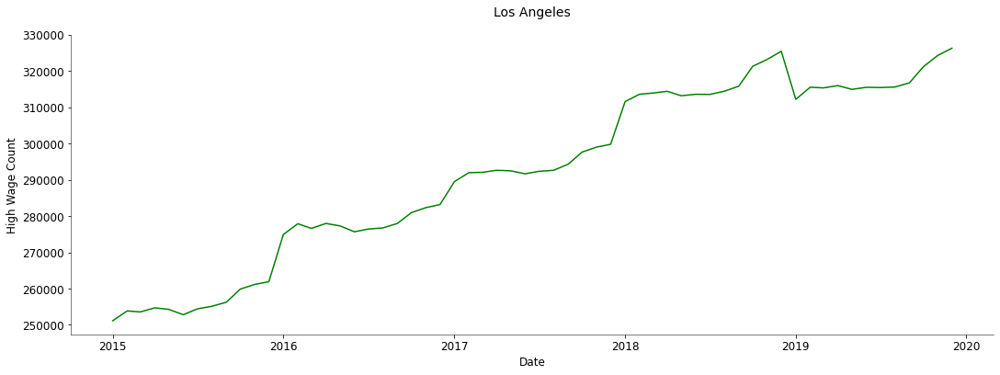

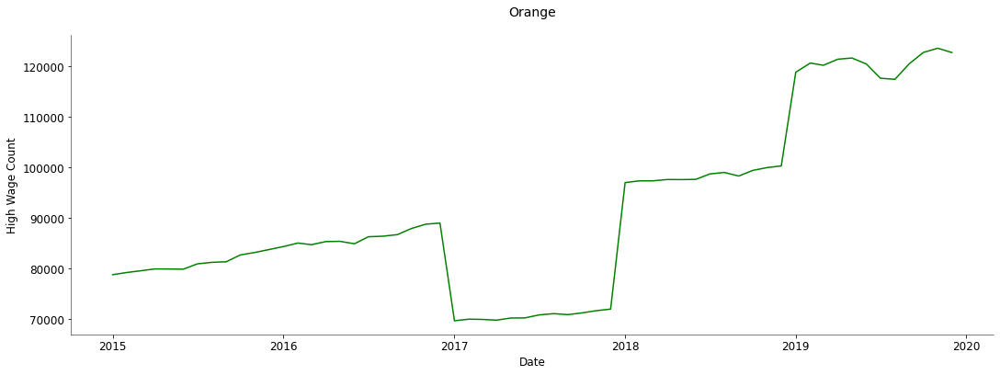

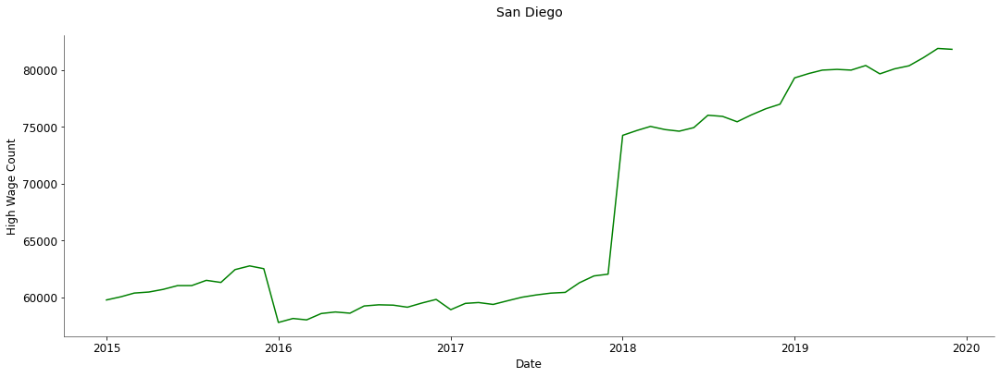

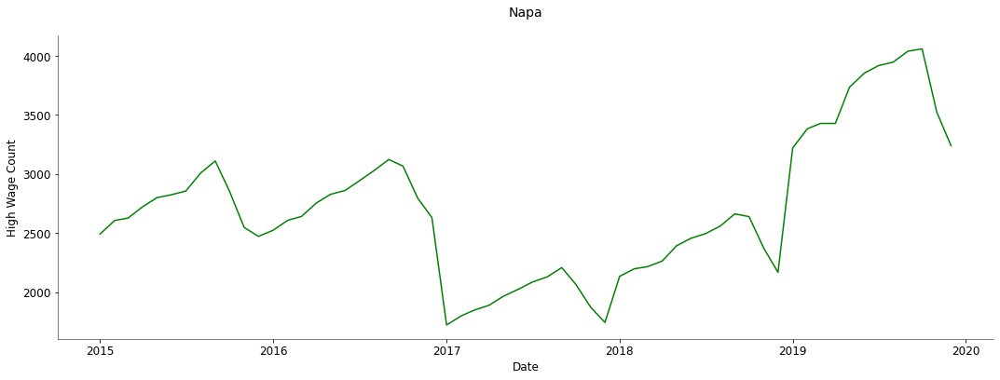

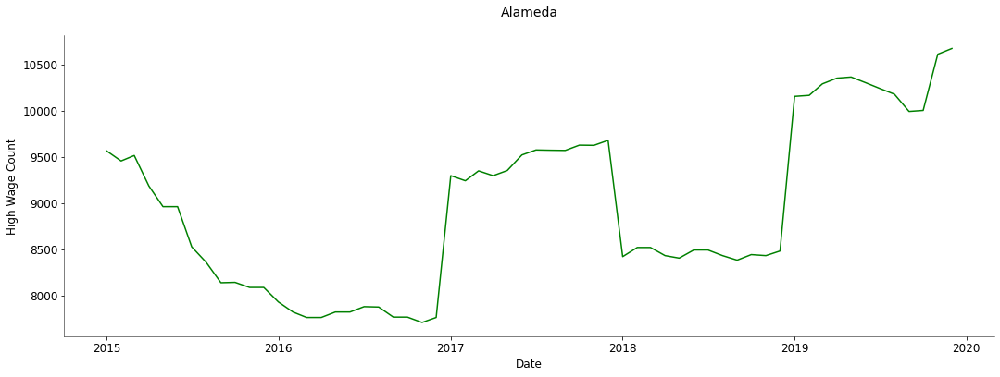

...

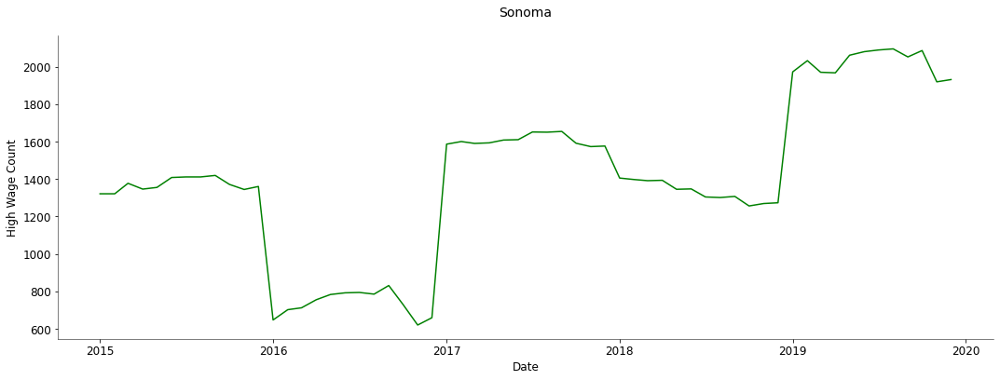

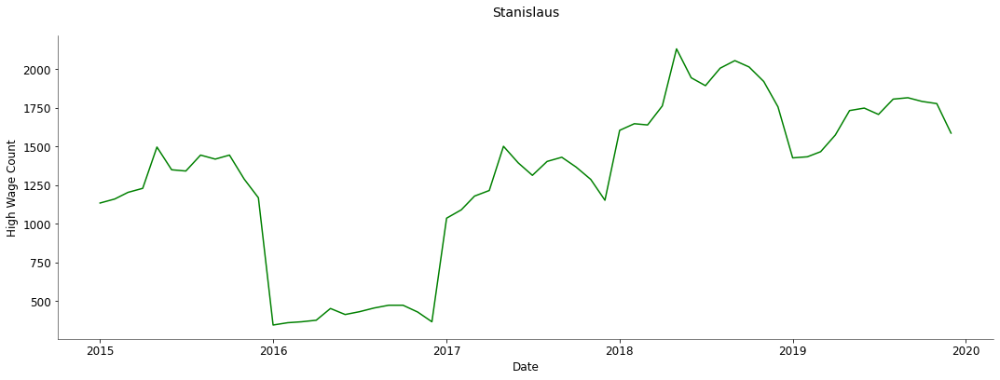

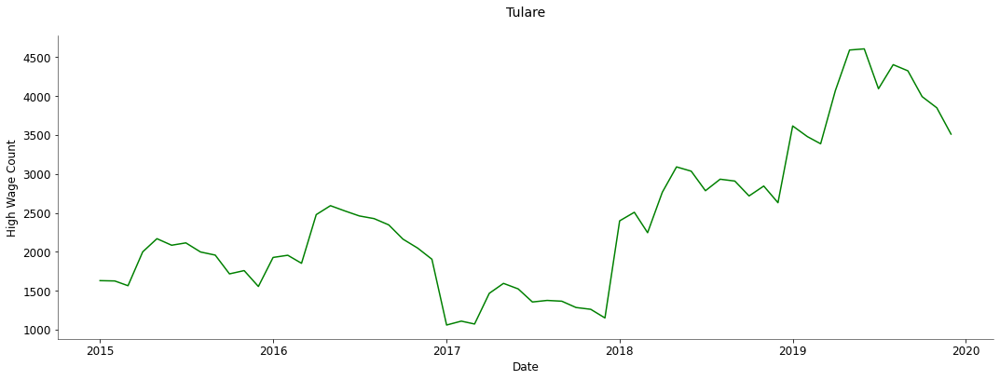

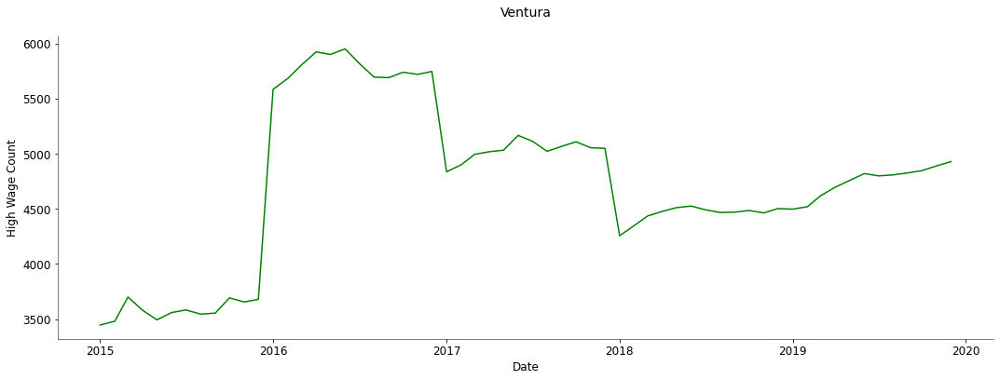

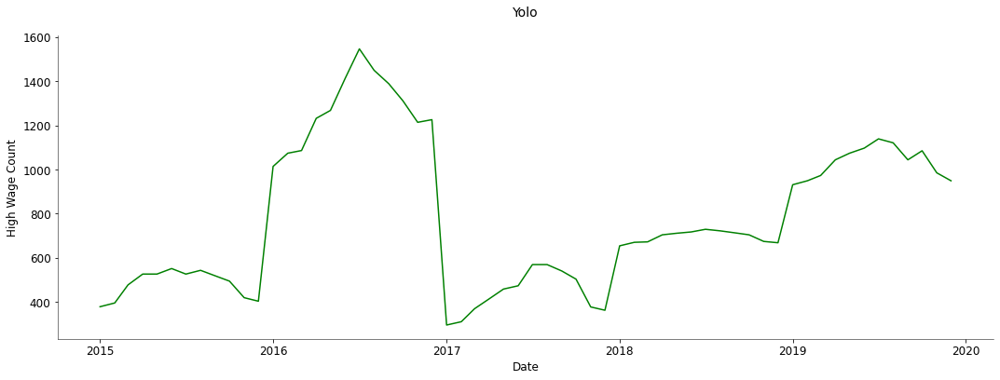

In [222]:
%run jqi_functions
for i in range(len(counties)):
    output_ = output.loc[output['County'] == counties[i]].groupby(by='Date').sum()
    ts_plot(output_, counties[i])

#### Rolling averages

In [34]:
def plotMovingAverage(series, window, title, plot_actual=False, scale=1.96):

    rolling_mean = series.rolling(window=window,center=True).mean()

    plt.figure(figsize=(15,5))
    plt.title(f"{title}\n Moving average\n window size = {window} months")
    plt.plot(rolling_mean, "g", label="Rolling mean trend")
    plt.xticks(rotation = 45)
    
    if plot_actual:
        plt.plot(series[window:], label="Actual values", color='#878a88', alpha=0.5)
        
    plt.legend(loc="upper left") 

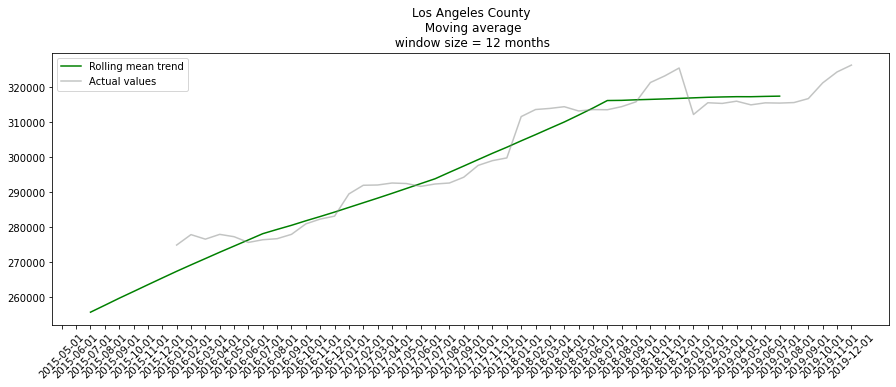

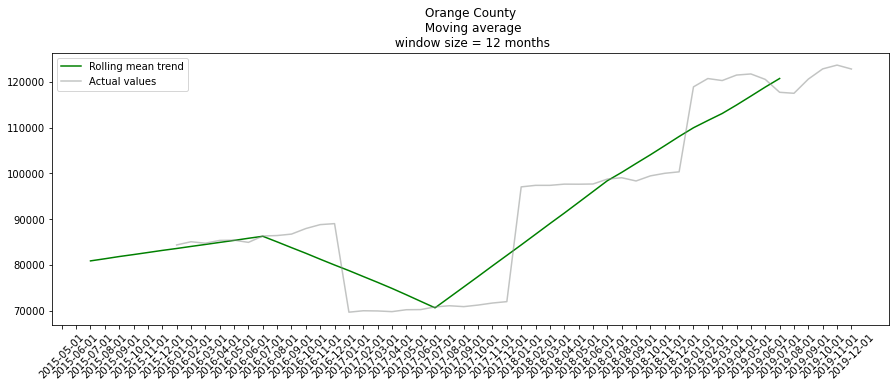

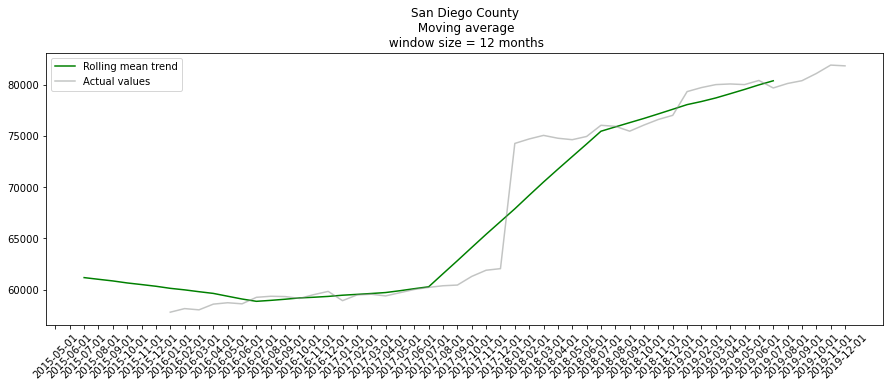

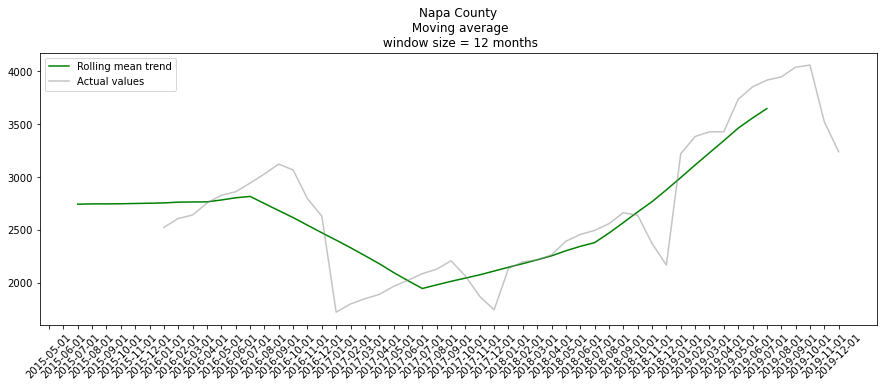

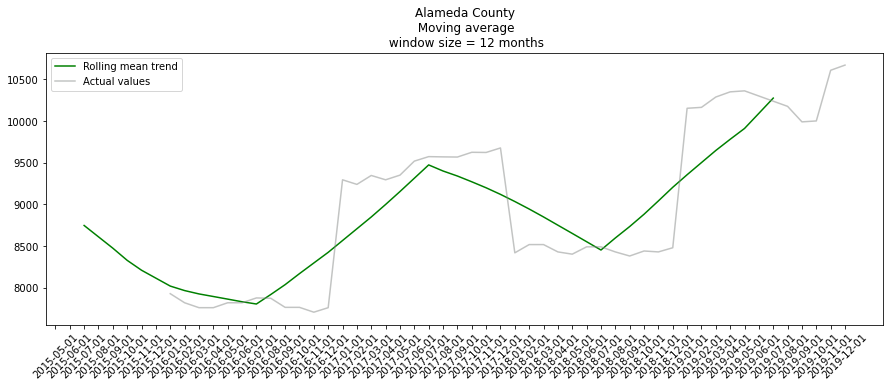

...

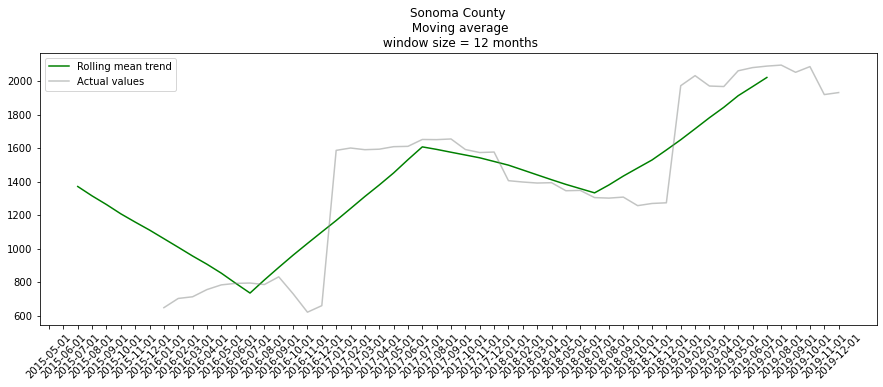

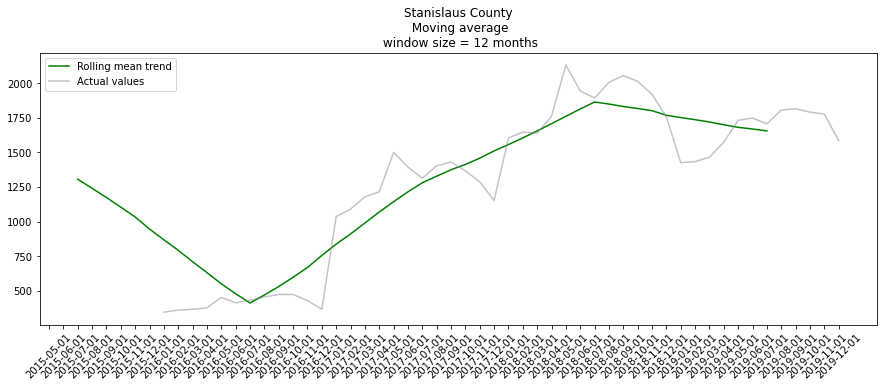

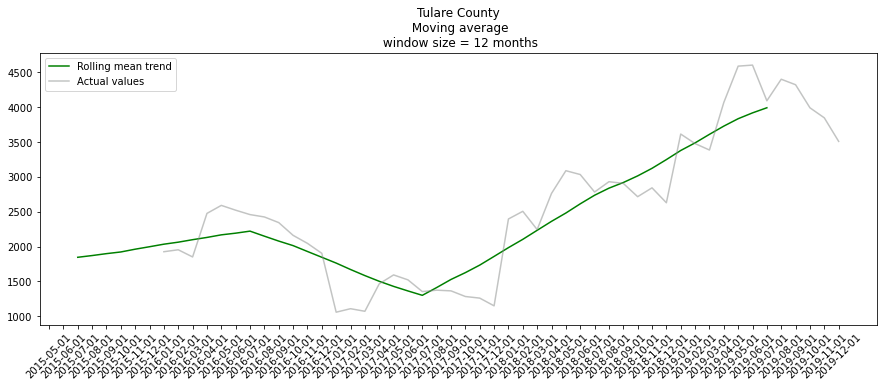

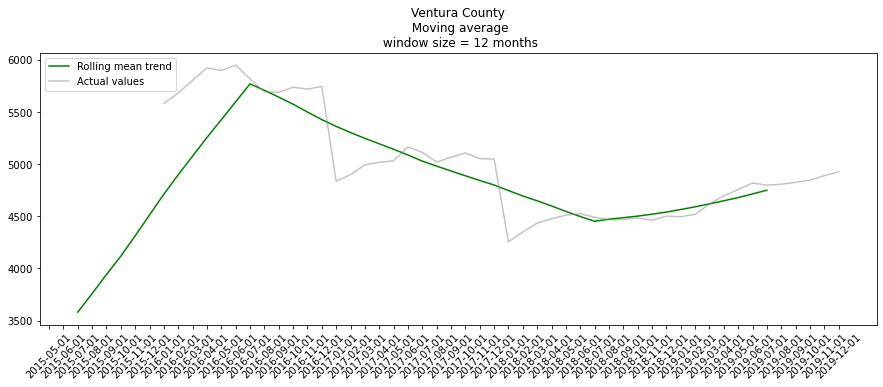

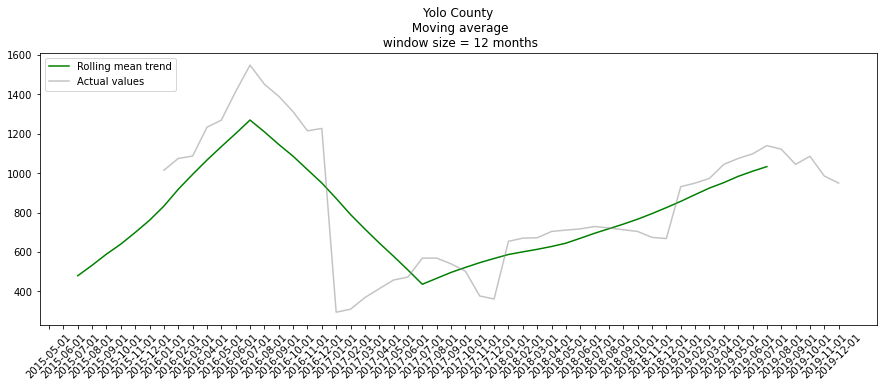

In [29]:
for i in range(len(counties)):
    output_ = output.loc[output['County'] == counties[i]].groupby(by='Date').sum()
    output_dt = output_[['High Wage Count']]
    plotMovingAverage(output_dt, 12, counties[i], plot_actual=True)

### Time Series Plots by Industry

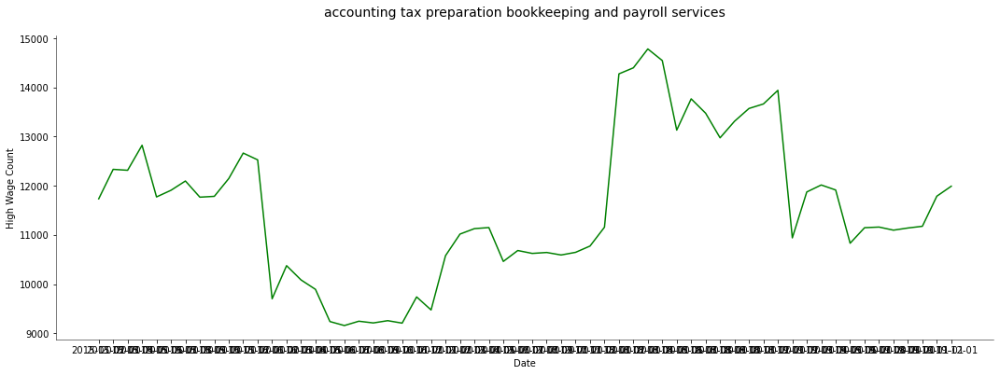

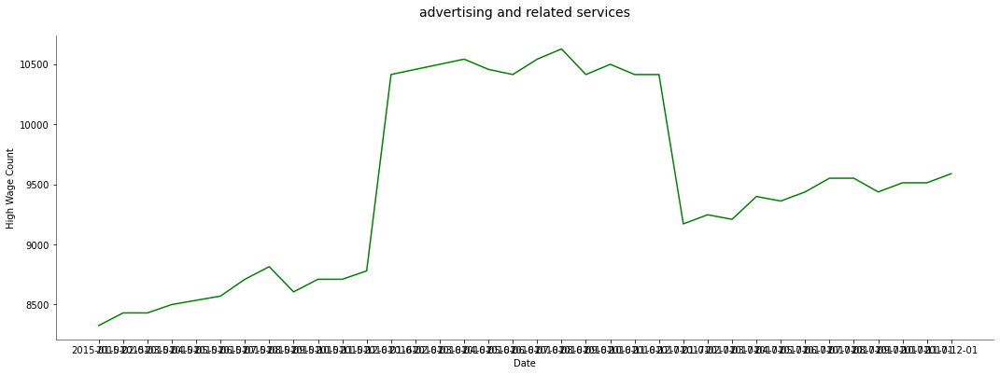

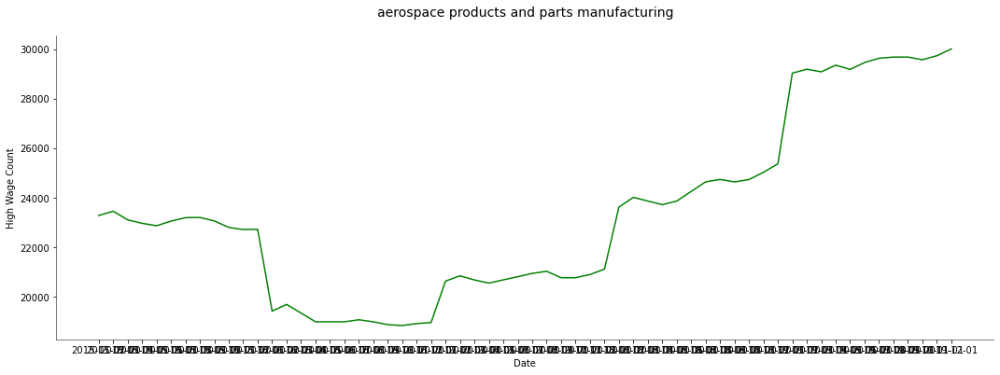

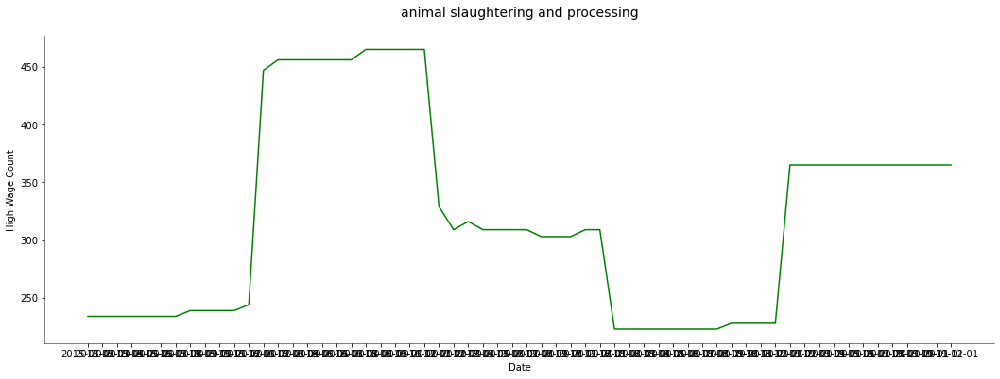

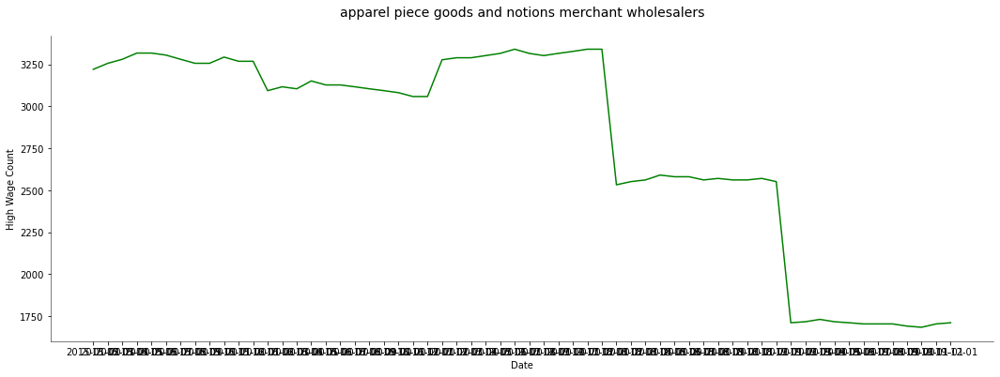

...

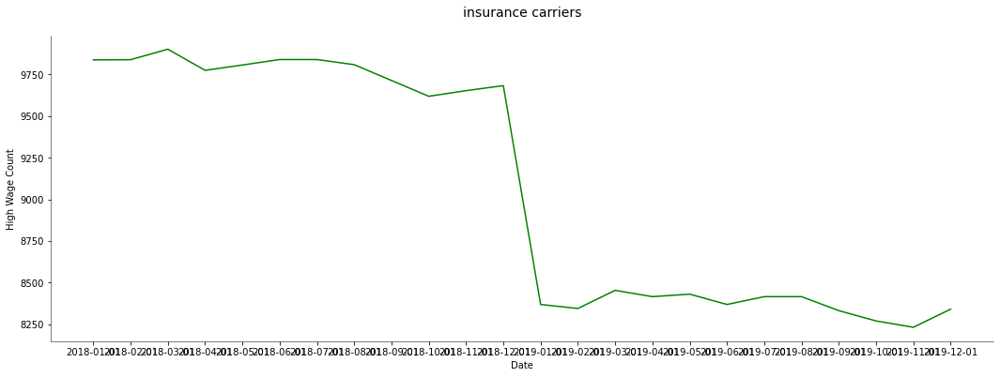

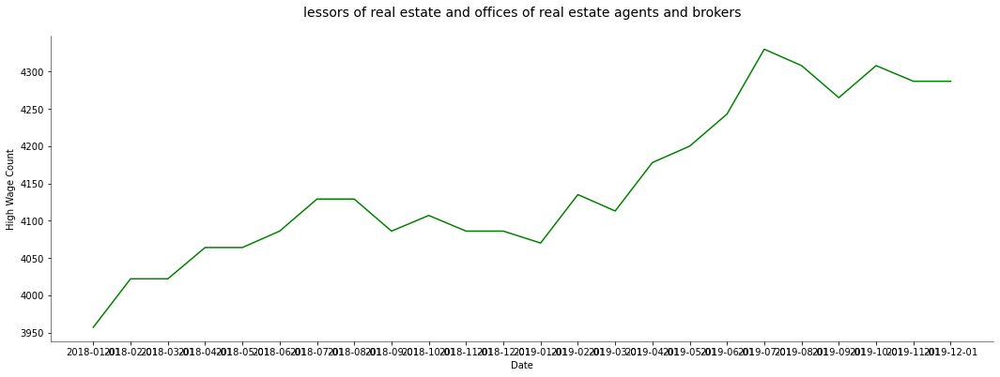

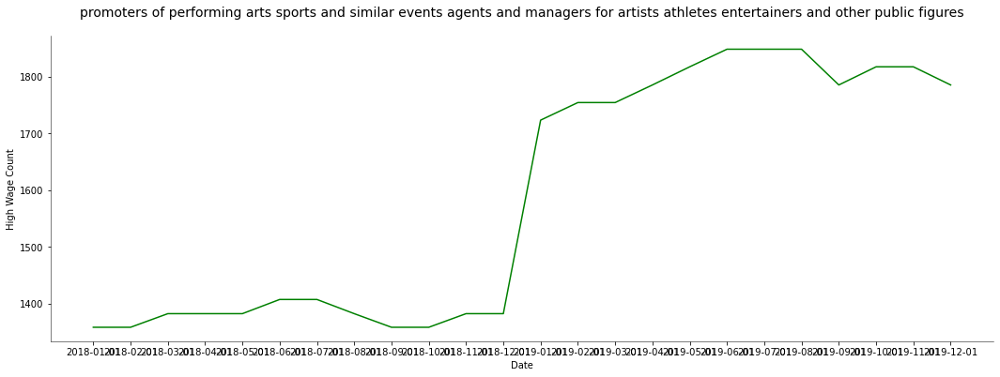

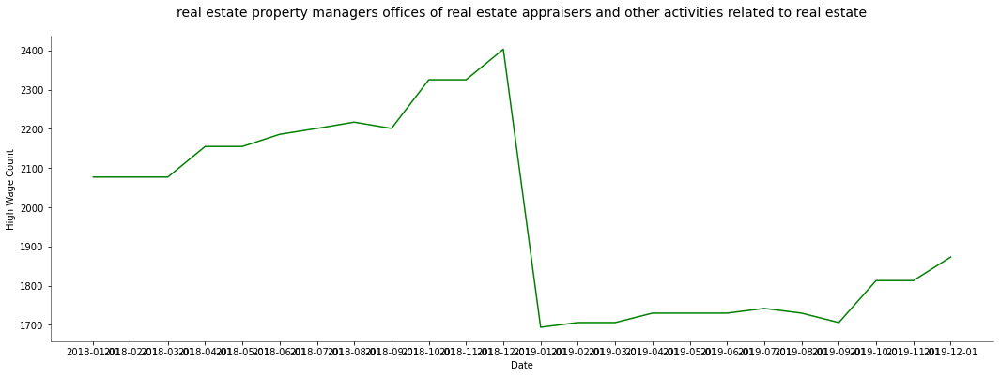

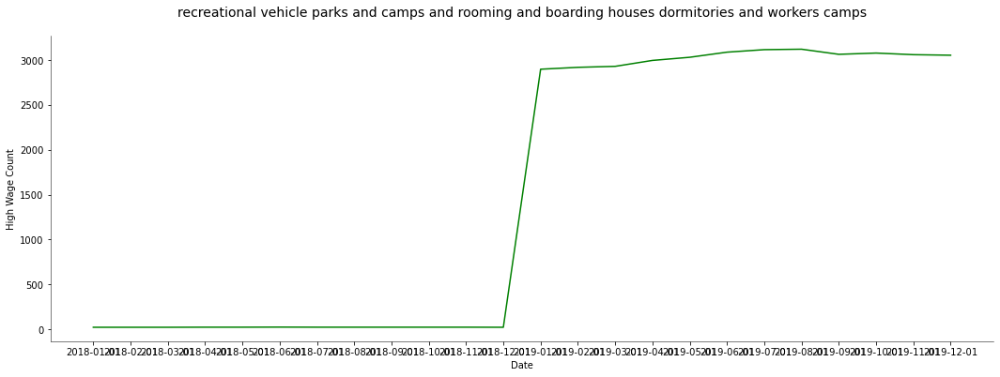

In [31]:
for i in range(len(industries)):
    output_ = output.loc[output['Industry'] == industries[i]].groupby(by='Date').sum()
    ts_plot(output_, industries[i])

#### Rolling averages

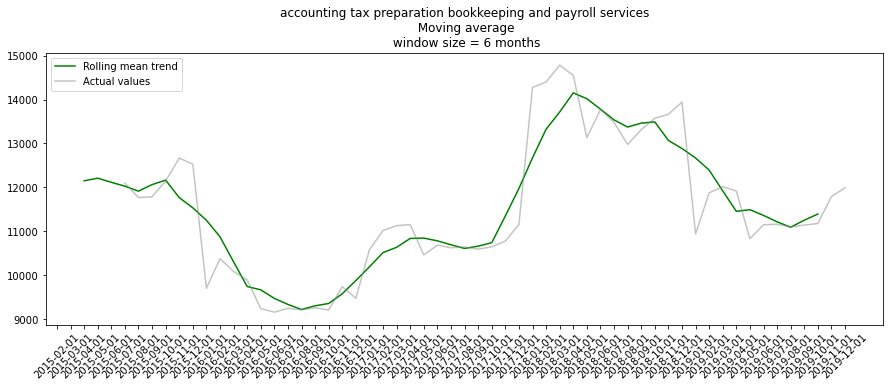

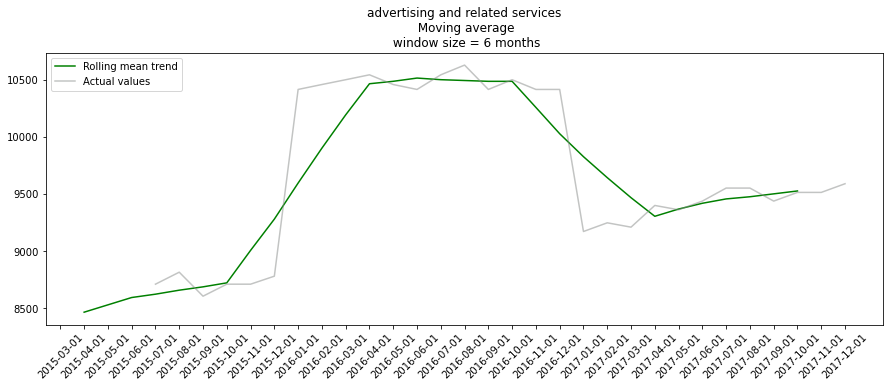

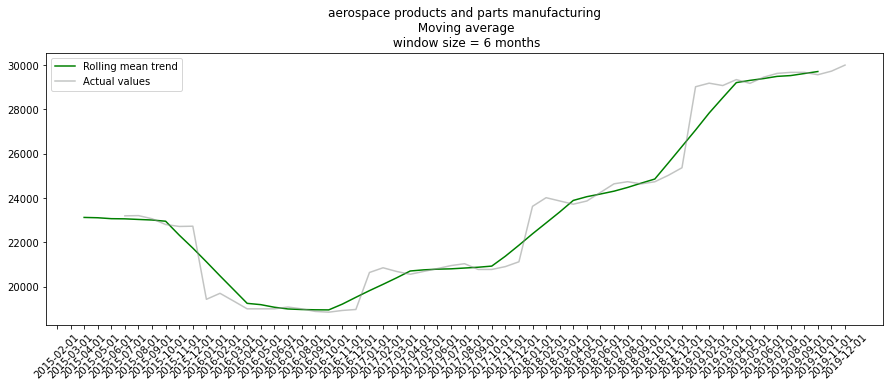

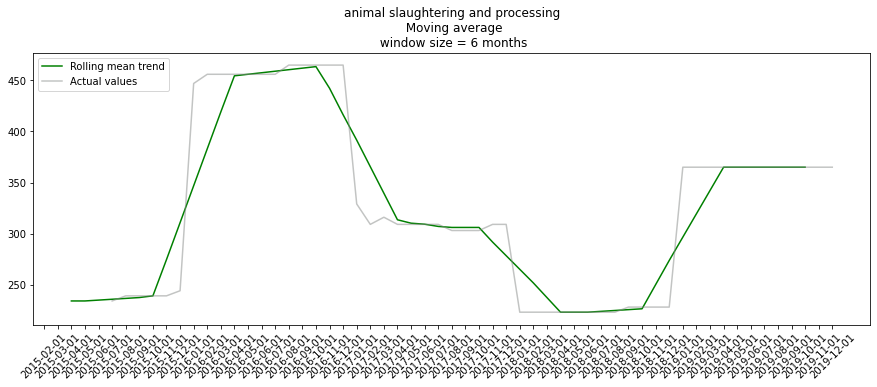

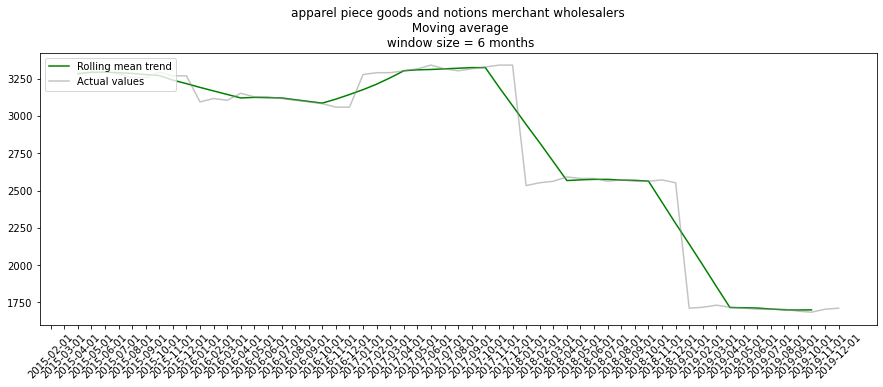

...

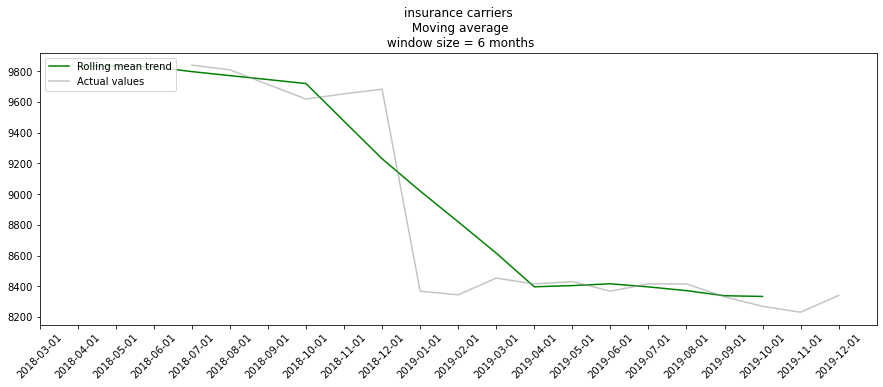

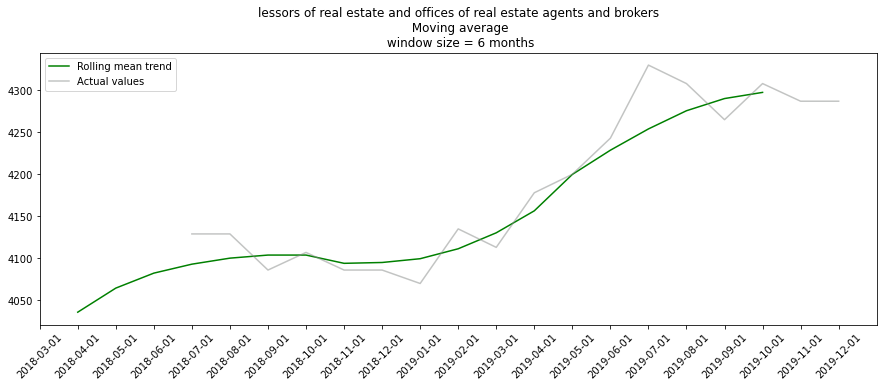

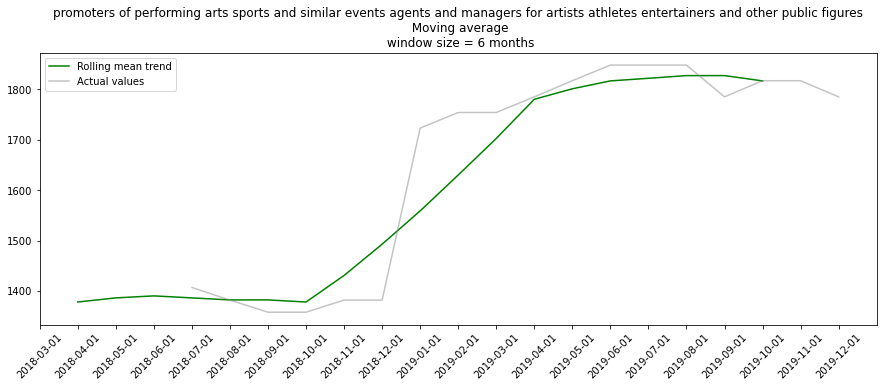

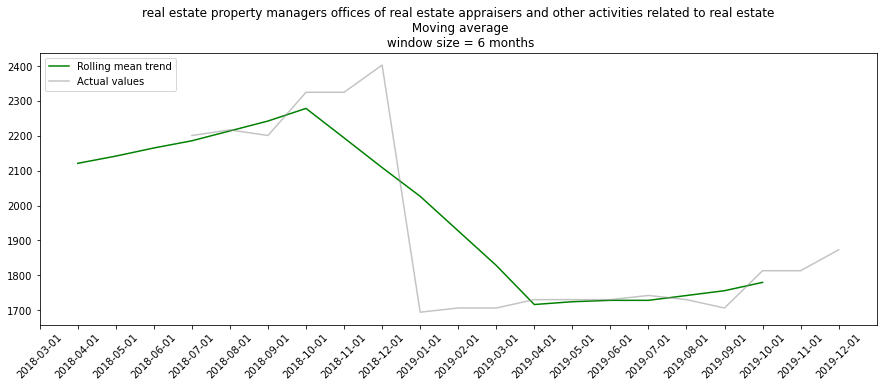

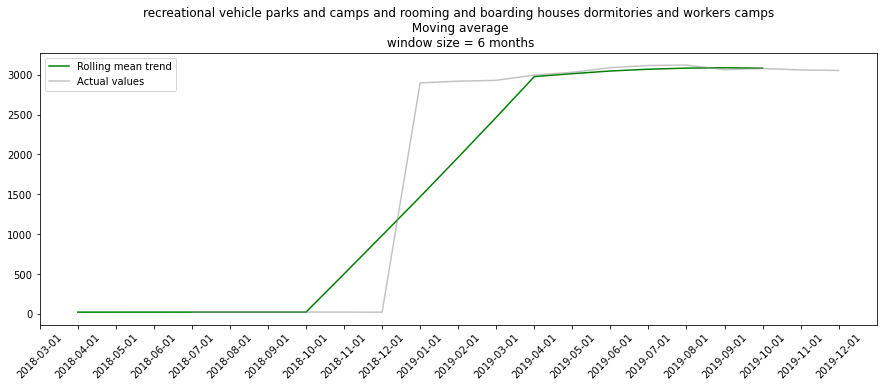

In [35]:
for i in range(len(industries)):
    output_ = output.loc[output['Industry'] == industries[i]].groupby(by='Date').sum()
    output_dt = output_[['High Wage Count']]
    plotMovingAverage(output_dt, 6, industries[i], plot_actual=True)

### Time Series Plots by Region

In [60]:
output = pd.merge(output, county_info, on='County', how='left')
output = output[['Industry', 'Date', 'County', 'High Wage Count', 'Employment Count', 'Cost of Living', 'CDI Regions']]

In [62]:
regions = output['CDI Regions'].unique()

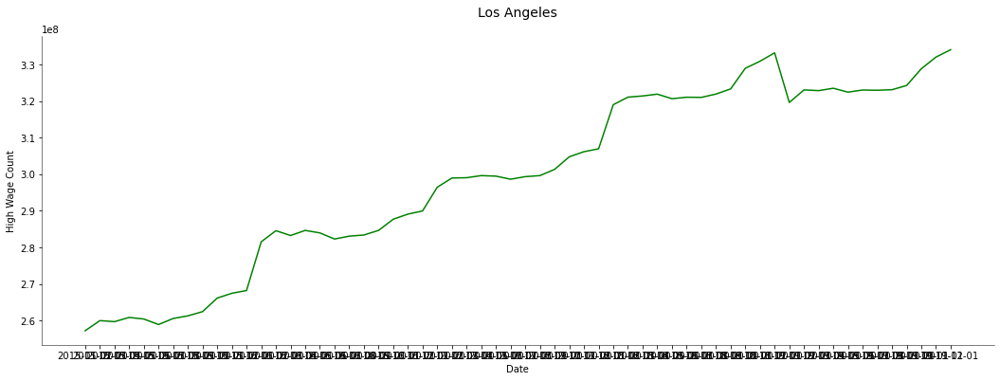

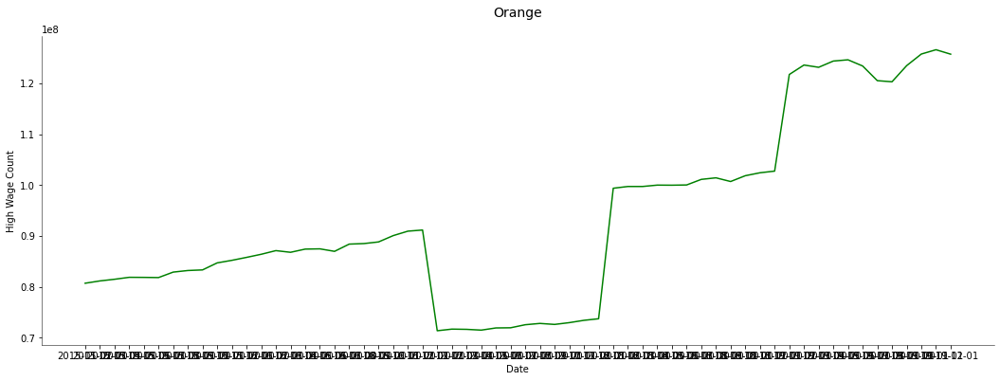

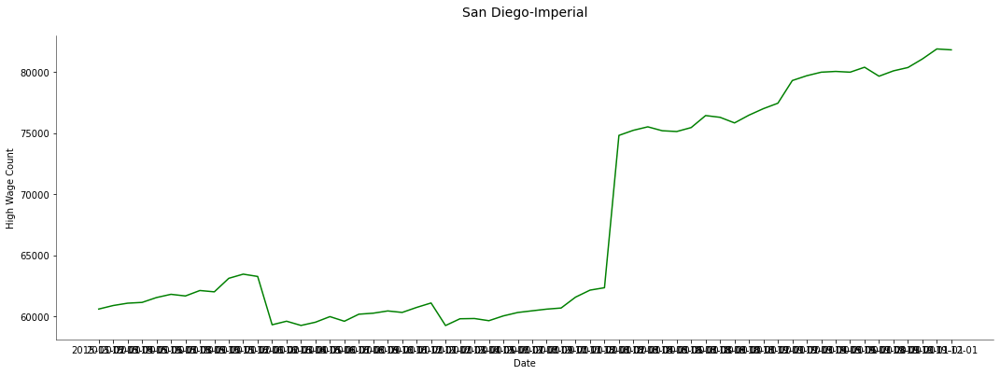

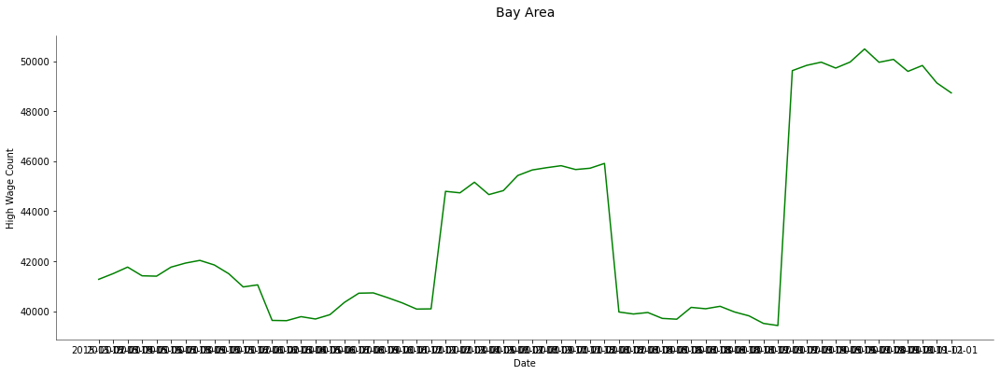

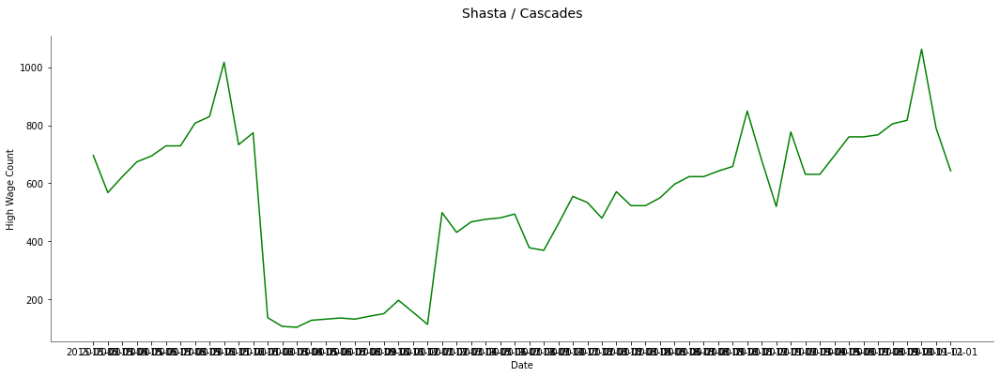

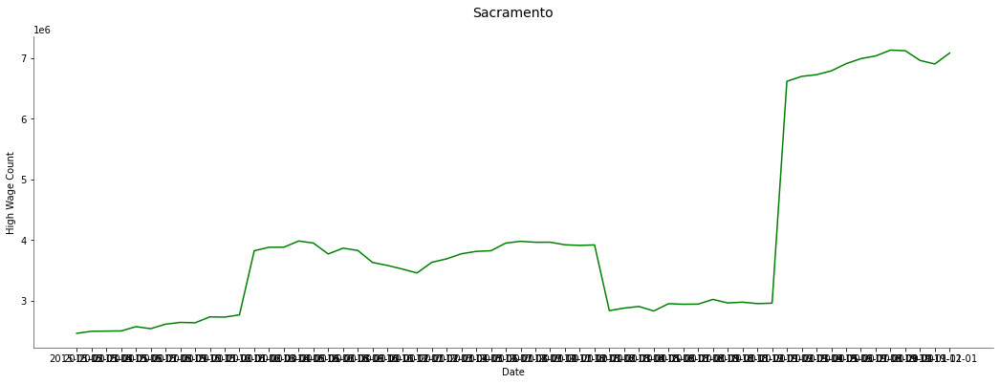

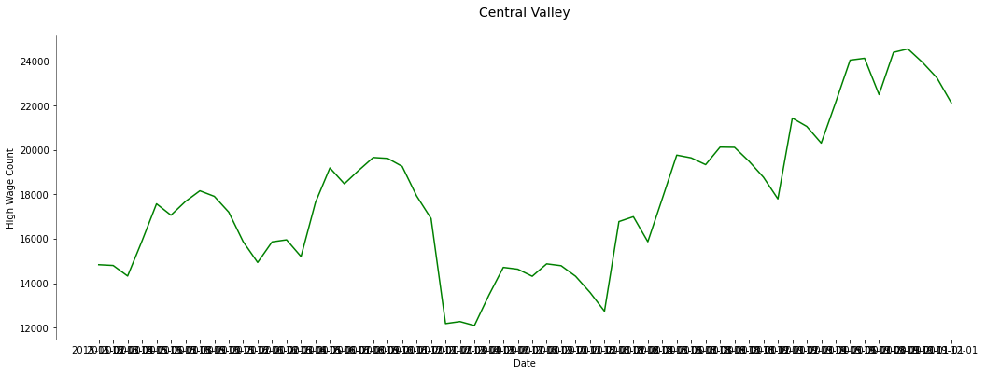

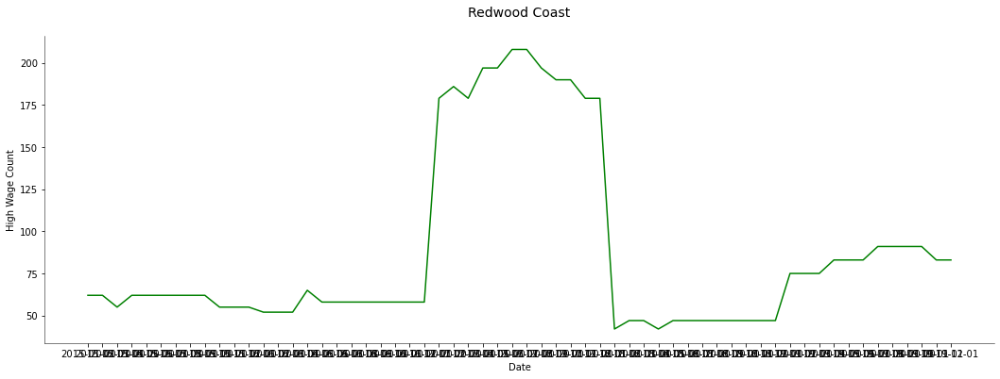

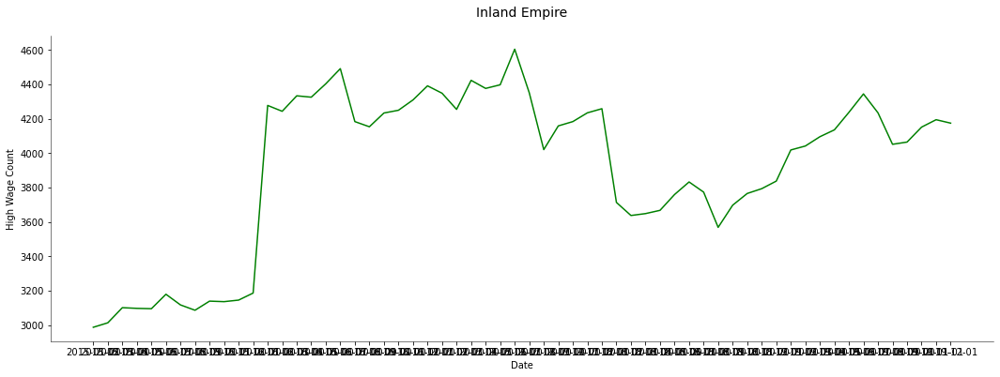

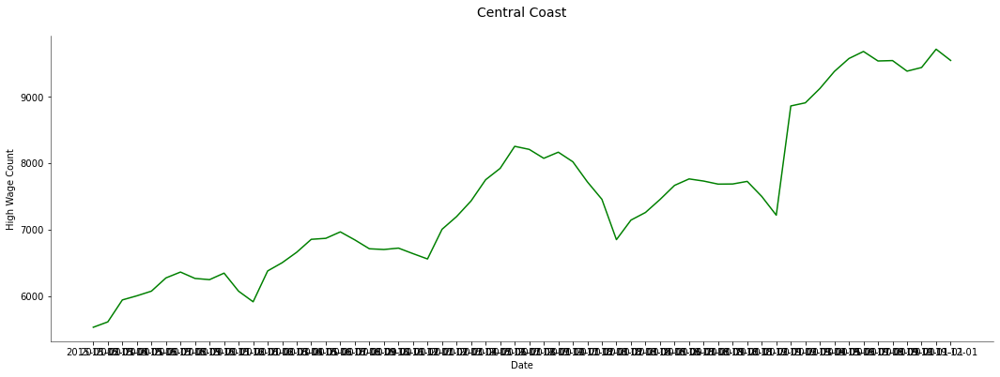

In [63]:
for i in range(len(regions)):
    output_ = output.loc[output['CDI Regions'] == regions[i]].groupby(by='Date').sum()
    ts_plot(output_, regions[i])

#### Rolling averages

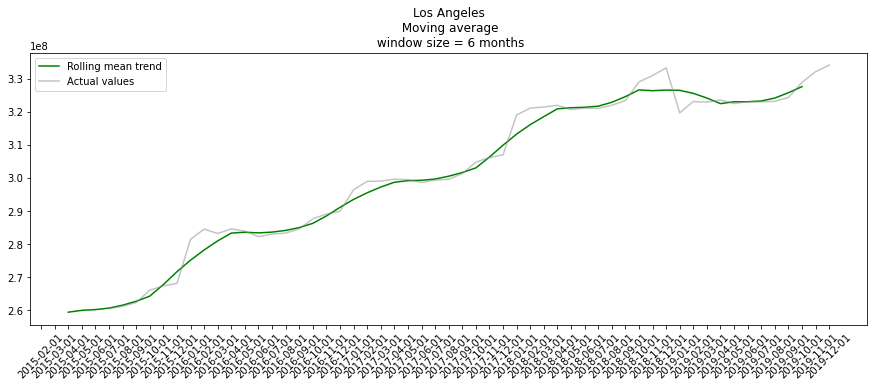

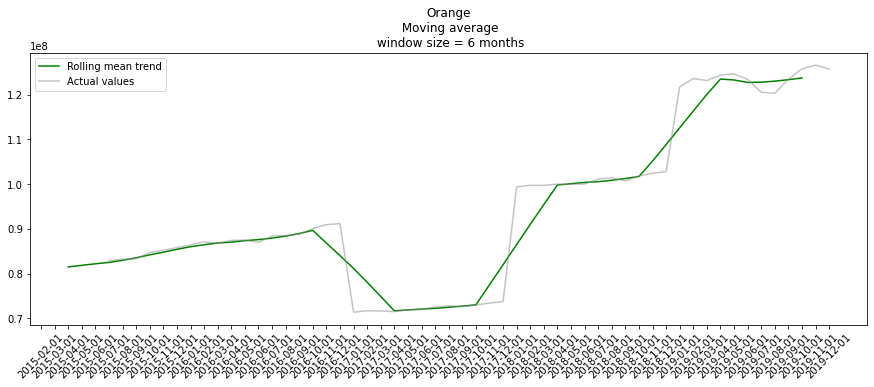

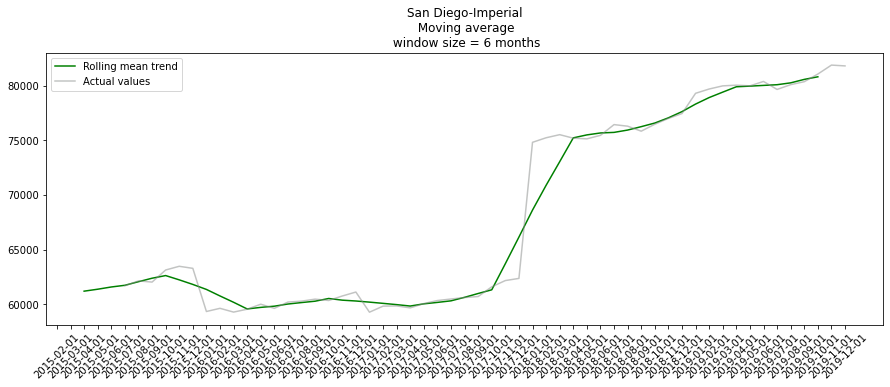

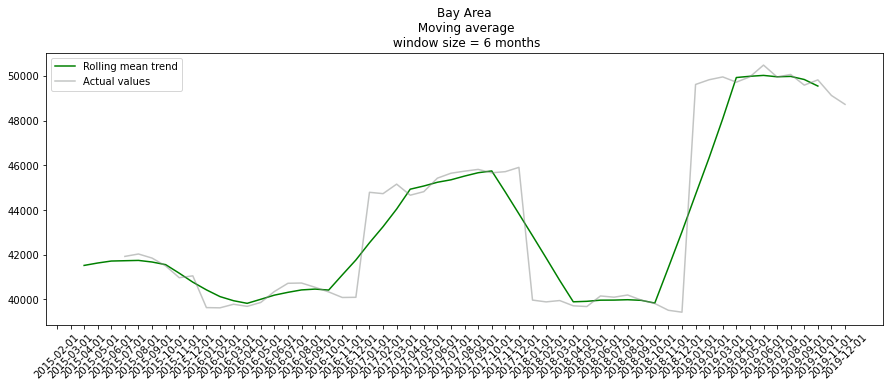

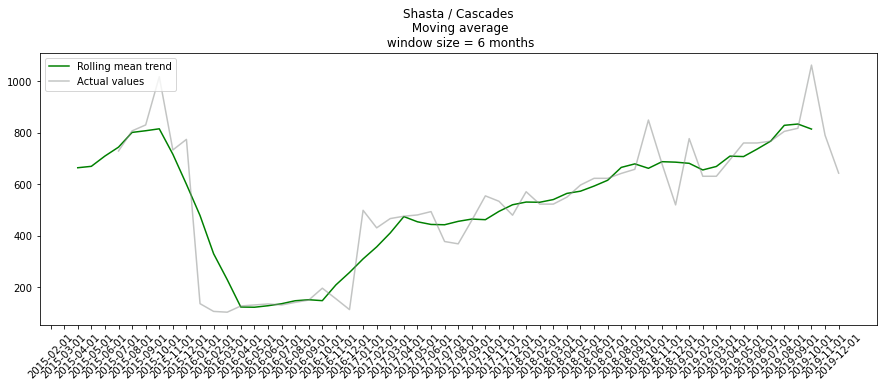

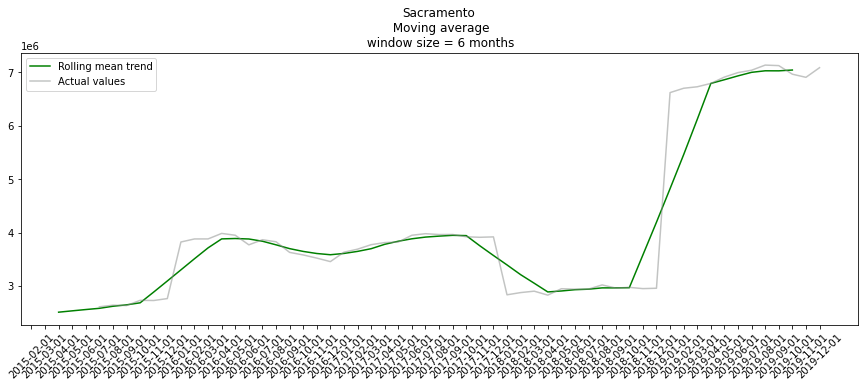

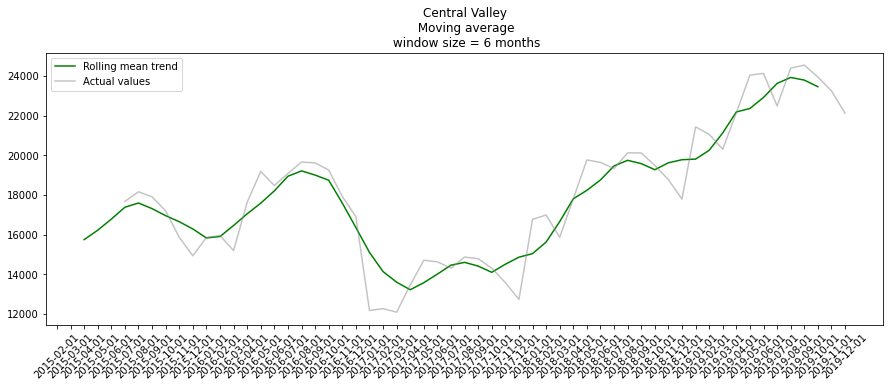

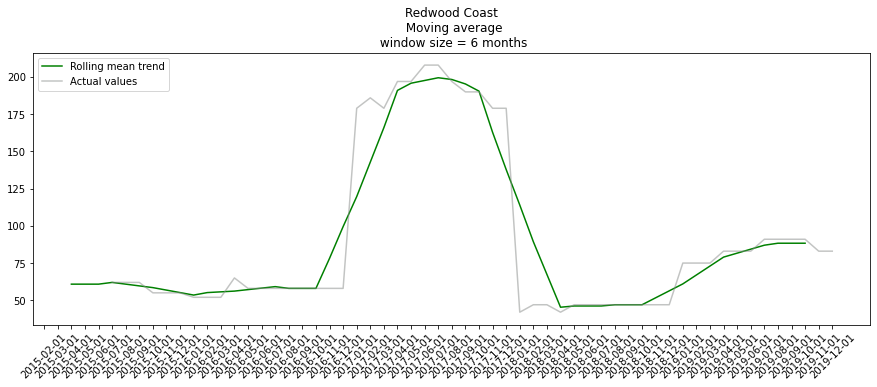

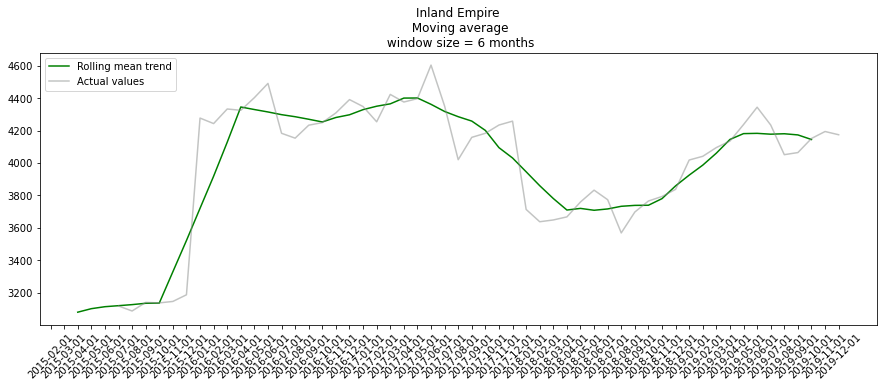

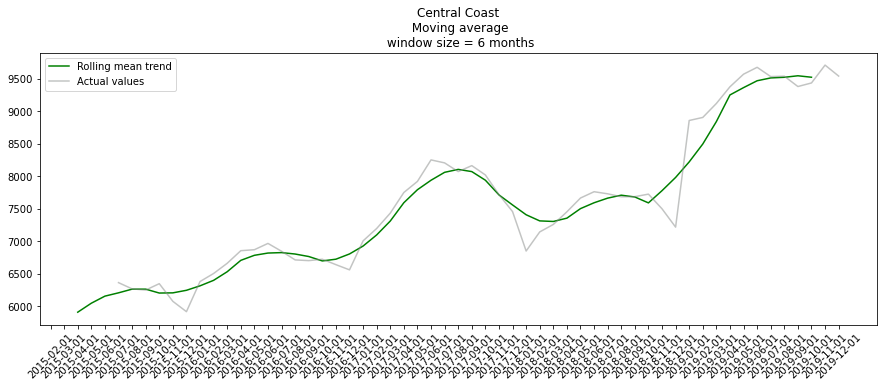

In [64]:
for i in range(len(regions)):
    output_ = output.loc[output['CDI Regions'] == regions[i]].groupby(by='Date').sum()
    output_dt = output_[['High Wage Count']]
    plotMovingAverage(output_dt, 6, regions[i], plot_actual=True)